In [8]:
pip install opencv-python ipyplot

In [9]:
import cv2 #used to load the images (in the future it will have other uses)
import numpy as np
import glob #used to read image names
import random #used to generate tran/test split
import ipyplot #it will be explained
from matplotlib import pyplot as plt #for all ur plotting needs
import pickle

In [10]:
#Citirea cailor pt poze
base_path = "D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/" #calea de baza pentru poze
files_list = [] # salvam caile pt fiecare poza

for i in range(5):
    files_list.append(glob.glob(base_path+str(i)+"/*.jpg"))
    print(glob.glob(base_path+str(i)+"/*.jpg")) #this is just so you can see output (delete)
    
# Verificare cailor
for i in files_list: 
    print(i)
    print(len(i))
    print()

['D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\0.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\1.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\10.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\11.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\12.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\13.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\14.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\15.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\16.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\17.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\18.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\19.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\2.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\3.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD

In [11]:
#Impartirea cailor in train si test

random.seed(20)
index_train = random.sample(range(0, 20), 14) #indexul pozelor de train
index_test = [] #indexul pozelor de test
for i in range(len(files_list[0])):
    if i not in index_train:
        index_test.append(i)

train_files =  [] #caile pt train
test_files = [] # caile pt test

for i in files_list:
    aux =[]
    for j in index_train:
        aux.append(i[j])
    train_files.append(aux)

for i in files_list:
    aux =[]
    for j in index_test:
        aux.append(i[j])
    test_files.append(aux)
 

#Verificare
print(index_train) # pozele pt train
print(index_test)

print(train_files)

for i in train_files: 
    print(i)
    print(len(i))
    print()
    
for i in test_files: 
    print(i)
    print(len(i))
    print()

[4, 8, 3, 10, 5, 0, 6, 13, 1, 11, 2, 15, 7, 19]
[9, 12, 14, 16, 17, 18]
[['D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\12.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\16.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\11.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\18.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\13.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\0.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\14.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\3.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\1.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\19.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\10.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\5.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/BD_100/0\\15.jpg', 'D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborat


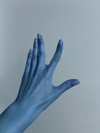
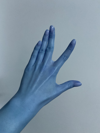
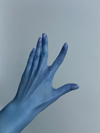
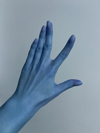
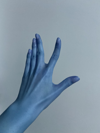
...
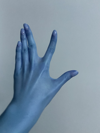
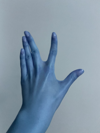
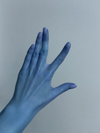
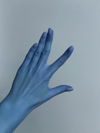
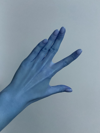

In [12]:
train_images = []
for L in train_files:
    s = []
    for l in L:
        s.append( cv2.imread(l) )
        #cv2.imshow('image',img)#DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions to crash; see https://github.com/jupyter/notebook/issues/3935.
    train_images.append(s)
test_images = []
for L in test_files:
    s = []
    for l in L:
        s.append( cv2.imread(l) )
    test_images.append(s)

ipyplot.plot_images(train_images[0], max_images=27, img_width=100)    
ipyplot.plot_images(test_images[0], max_images=12, img_width=100)


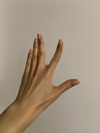
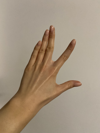
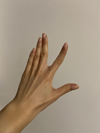
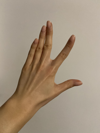
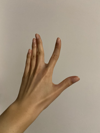
...
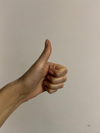
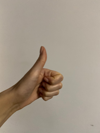
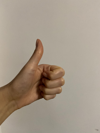
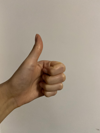
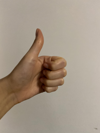

In [13]:
#Salvarea pozelor in train si test + BGR to RGB

train_images = [] #salvare poze train
test_images = [] #salvare poze test

for i in train_files:
    aux = []
    for j in i:
#         print('yes')
        aux.append(cv2.cvtColor(cv2.imread(j),cv2.COLOR_BGR2RGB))
#         aux.append(cv2.cvtColor(cv2.imread(j),cv2.COLOR_BGR2RGB))
    train_images.append(aux)

for i in test_files:
    aux = []
    for j in i:
        aux.append(cv2.cvtColor(cv2.imread(j),cv2.COLOR_BGR2RGB))
    test_images.append(aux)


#Verificare 
for i in  train_images:
    ipyplot.plot_images(i, max_images=27, img_width=100)


for i in  test_images:
    ipyplot.plot_images(i, max_images=27, img_width=100)
 

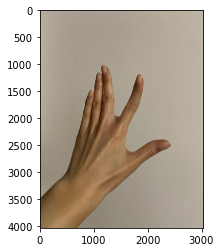

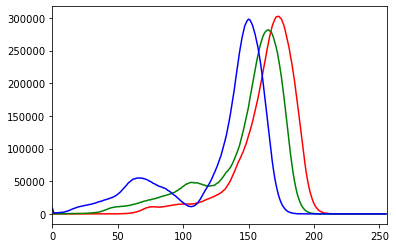

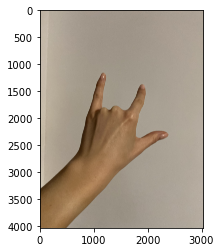

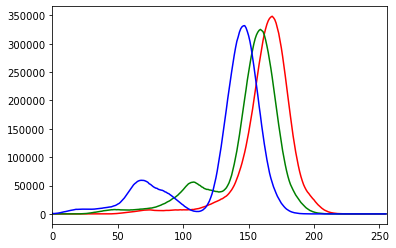

(4032, 3024, 3)
(4032, 3024, 3)


In [16]:
#Calculare Histograma

color = ('r','g','b')
img0, img1 = train_images[0][0], train_images[2][1]

plt.imshow(img0)
plt.show()

# ipyplot.plot_image(img0, max_images=27, img_width=100)

for i,col in enumerate(color):
    histr = cv2.calcHist([img0],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()


plt.imshow(img1)
plt.show()
for i,col in enumerate(color):
    histr = cv2.calcHist([img1],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()
# rosu + verde = mana ? albastru = fundal ?

print(np.shape(img0))
print(np.shape(img1))

In [17]:
#Redimensionare imagine  De ce ?

#img.shape - returneaza (linii, coloane, canale)
scale_percent = 20 
print(img0.shape)
width = int(img0.shape[1] * scale_percent / 100)
height = int(img0.shape[0] * scale_percent / 100)
dim = (width, height)
print(dim)
train_images_resized = []
test_images_resized = []

for i in train_images:
    aux = []
    for j in i:
        aux.append(cv2.resize(j, dim, cv2.INTER_AREA))
    train_images_resized.append(aux)
        
for i in test_images:
    aux = []
    for j in i:
        aux.append(cv2.resize(j, dim, cv2.INTER_AREA))
    test_images_resized.append(aux)

#Verificare
print(np.shape(train_images_resized))

print(np.shape(test_images_resized))


(4032, 3024, 3)
(604, 806)
(5, 14, 806, 604, 3)
(5, 6, 806, 604, 3)



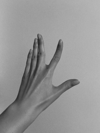
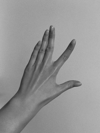
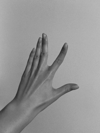
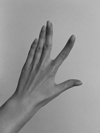
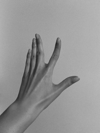
...
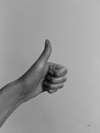
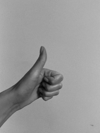
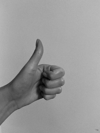
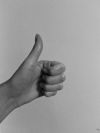
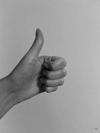

In [18]:
#RGB to GRAY

train_images_resized_gray = []
test_images_resized_gray = []

for i in train_images_resized:
    aux = []
    for j in i:
        #b, g ,r = cv2.split(j)
        #aux.append(b)
        aux.append(cv2.cvtColor(j, cv2.COLOR_RGB2GRAY))
    train_images_resized_gray.append(aux)

for i in test_images_resized:
    aux = []
    for j in i:
        #b, g ,r = cv2.split(j)
        #aux.append(b)
        aux.append(cv2.cvtColor(j, cv2.COLOR_RGB2GRAY))
    test_images_resized_gray.append(aux)

#Verificare 
for i in  train_images_resized_gray:
    ipyplot.plot_images(i, max_images=27, img_width=100)

for i in  test_images_resized_gray:
    ipyplot.plot_images(i, max_images=27, img_width=100)



In [64]:
#Scriere date in fisiere

file = open('D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_train_images_resized_gray', 'wb')
pickle.dump(train_images_resized_gray, file)
file.close()
file = open('D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_test_images_resized_gray', 'wb')
pickle.dump(test_images_resized_gray, file)
file.close()

file = open('D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_train_images_resized', 'wb')
pickle.dump(train_images_resized, file)
file.close()
file = open('D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_test_images_resized', 'wb')
pickle.dump(test_images_resized, file)
file.close()


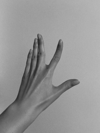
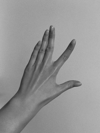
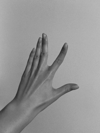
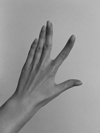
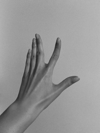
...
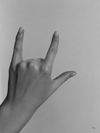
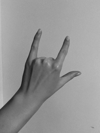
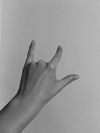
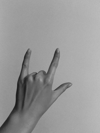
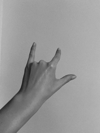

70


In [20]:
flat_list = [item for sublist in train_images_resized_gray for item in sublist]
ipyplot.plot_images(flat_list, max_images=35, img_width=100)
print(len(flat_list))

In [21]:
import copy

def salt_and_pepper_filter(noise_img):
    (w,h)=noise_img.shape
    new_image = copy.copy(noise_img)
    print(max(noise_img[5]))
    for i in range(1,w-1):
        for j in range(1,h-1):
            l = list()
            if noise_img[i][j] == 0 or noise_img[i][j] == 255:
    #             print("aici")
                l = [noise_img[i-1][j-1], noise_img[i-1][j], noise_img[i-1][j+1], noise_img[i][j-1], noise_img[i][j+1], noise_img[i+1][j-1], noise_img[i+1][j], noise_img[i+1][j+1]]
    #             print(l)
                l = np.sort(l)
    #             print(l)
    #             new_image2[i][j] = l[4]
                new_list = [x for x in l if x > 0]
                if len(new_list) > 0:
                    new_image[i][j] = new_list[0]                

In [49]:
#Sobel

def apply_sobel(dataset, kernel, ddepth, gauss_blur):
    images_resized_gray_sobel = []
    for i in dataset:
        aux = []
        for j in i:
    #         src = cv2.medianBlur(j, 15)
    #         src = salt_and_pepper_filter(j)
            src = cv2.GaussianBlur(j, gauss_blur,cv2.BORDER_CONSTANT)
            grad_x = cv2.Sobel(src, ddepth, 1, 0, ksize=3, scale=0.1, delta=0, borderType=cv2.BORDER_DEFAULT)
            abs_grad_x = cv2.convertScaleAbs(grad_x)
            grad_y = cv2.Sobel(src, ddepth, 0, 1, ksize=3, scale=0.1, delta=0, borderType=cv2.BORDER_DEFAULT)
            abs_grad_y = cv2.convertScaleAbs(grad_y)

            grad = cv2.addWeighted(abs_grad_x, 1, abs_grad_y, 1, 0)
            grad = cv2.morphologyEx(grad, cv2.MORPH_GRADIENT, kernel)
            aux.append(grad)

        images_resized_gray_sobel.append(aux)
    return images_resized_gray_sobel
    


3



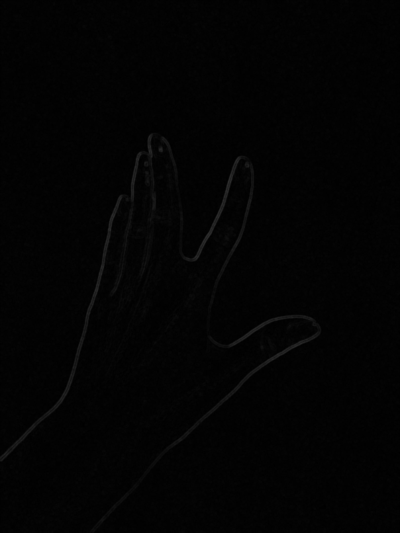
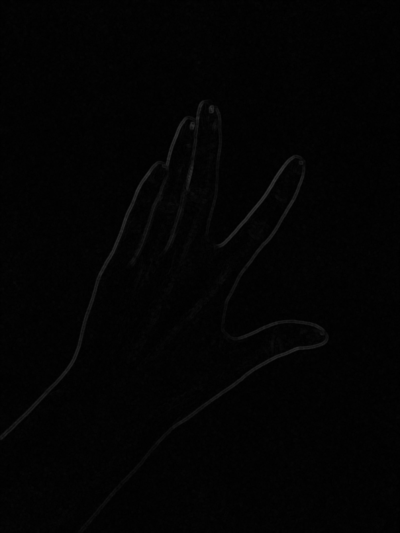
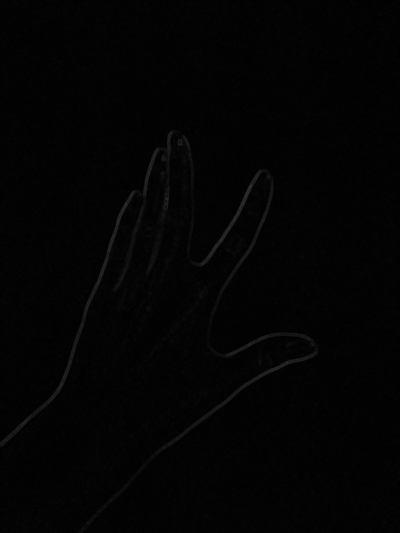
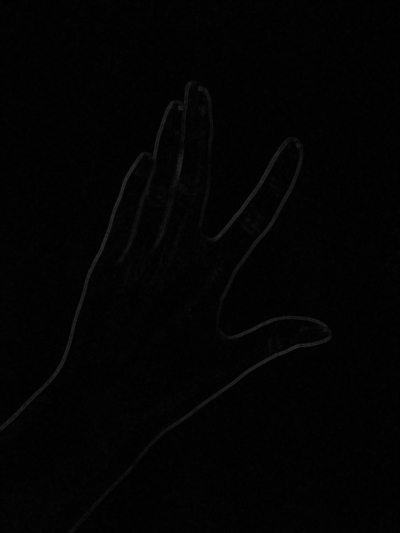
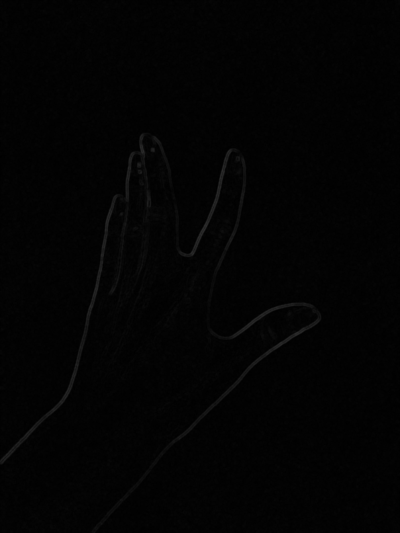


...


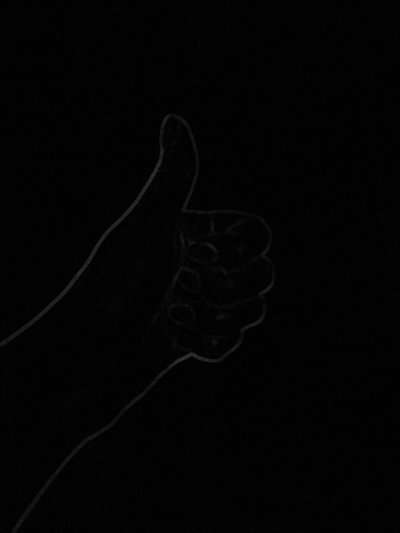
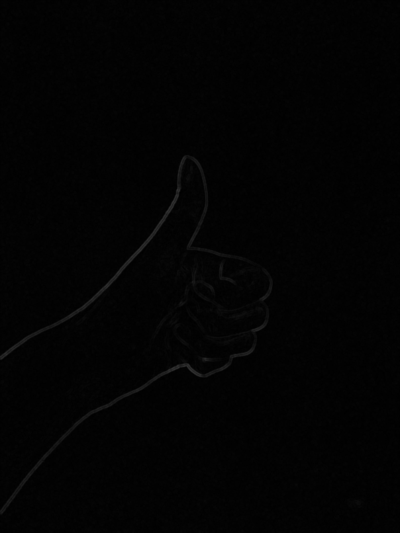
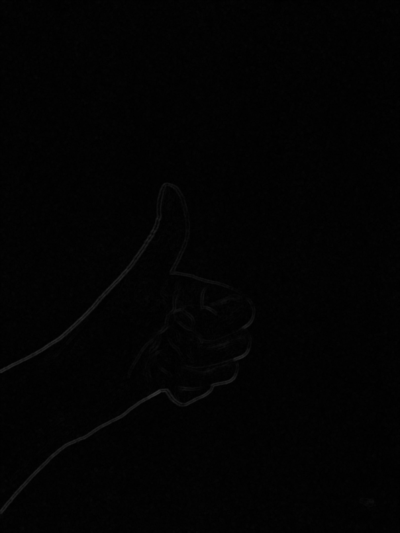
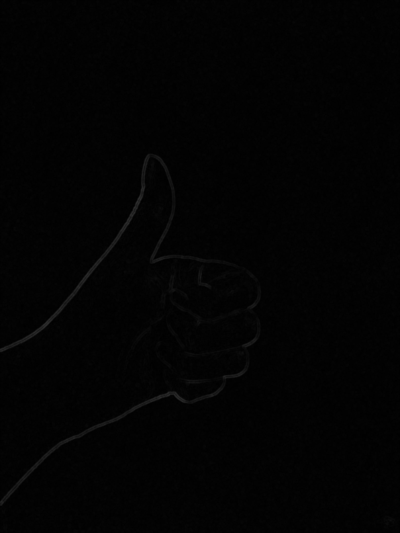
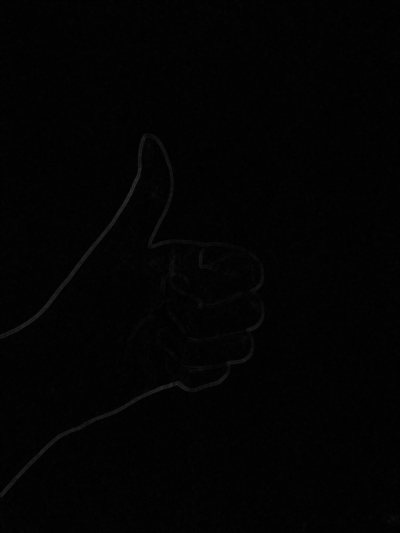

In [50]:
ddepth = cv2.CV_16S
print(ddepth)
kernel_1 = np.ones((6,6),np.float32)/25
kernel_2 = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
gauss_blur = (3,3)


train_images_resized_gray_sobel = apply_sobel(train_images_resized_gray, kernel_2, ddepth, gauss_blur)

for i in  train_images_resized_gray_sobel:
    ipyplot.plot_images(i, max_images=5, img_width=400)
    
    
test_images_resized_gray_sobel = apply_sobel(test_images_resized_gray, kernel_2, ddepth, gauss_blur)

for i in  test_images_resized_gray_sobel:
    ipyplot.plot_images(i, max_images=5, img_width=400)


In [57]:
#Scoatere coorodnate contur

data_for_train = []
data_for_test = []

all_data_for_train = []
all_data_for_test = []

# print(len(train_images_resized_gray_sobel))
for i in train_images_resized_gray_sobel:
    aux = []
    for j in i:
        x,y = np.nonzero(j)
#         print(x,y)
        t = np.array(list(zip(x, y))).flatten()
#         print(t)
        aux.append(t[0:10000])        
    data_for_train.append(aux)
      
for i in test_images_resized_gray_sobel:
    aux = []
    for j in i:
        x,y = np.nonzero(j)
        t = np.array(list(zip(x, y))).flatten()
        aux.append(t[0:10000])
    data_for_test.append(aux)
   
    
print(np.shape(data_for_train))
print(np.shape(data_for_test))
# print(data_for_train)


(5, 14, 10000)
(5, 6, 10000)


In [58]:
y = np.zeros(np.shape(data_for_train)[0]*np.shape(data_for_train)[1])
print(y)
for i in range(1,np.shape(data_for_train)[0]):
    y[np.shape(data_for_train)[1]*i:] = i
    
print(y)

data_for_train = np.reshape(data_for_train, (np.shape(data_for_train)[0]*np.shape(data_for_train)[1], np.shape(data_for_train)[2]))
# print(data_for_train)

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3, metric='euclidean')
knn.fit(data_for_train, y) # train

cntTrue = 0
cntFalse = 0
y_predicted = []
y_test = []
#test
for i in range(np.shape(data_for_test)[0]):
    for j in range(np.shape(data_for_test)[1]):
        a = knn.predict(data_for_test[i][j].reshape(1, -1))
        y_predicted.append(int(a[0]))
        y_test.append(i)
        print("Prediction : " + str(int(a[0])) + " Real : " + str(i) + "   " +  str(i == int(a[0])))
        if i == a:
            cntTrue += 1
        else:
            cntFalse += 1 

print("True : " + str(cntTrue) + "  False : " + str(cntFalse))

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.]
Prediction : 4 Real : 0   False
Prediction : 3 Real : 0   False
Prediction : 1 Real : 0   False
Prediction : 0 Real : 0   True
Prediction : 1 Real : 0   False
Prediction : 0 Real : 0   True
Prediction : 0 Real : 1   False
Prediction : 1 Real : 1   True
Prediction : 0 Real : 1   False
Prediction : 0 Real : 1   False
Prediction : 0 Real : 1   False
Prediction : 0 Real : 1   False
Prediction : 1 Real : 2   False
Prediction : 1 Real : 2   False
Prediction : 1 Real : 2   False
Prediction : 0 Real : 2   False
Prediction : 0 Real : 2   False
Prediction : 1 Real : 2   False

In [32]:
from sklearn.metrics import confusion_matrix

print(data_for_test)
print(y_predicted)
print(np.shape(data_for_test)[0])
print(list(range(np.shape(data_for_test)[0])))
cm = confusion_matrix(y_true = y ,y_pred = y_predicted, labels =  list(range(np.shape(data_for_test)[0])))
print(cm)


[[array([  0,   0,   0,   1,   0,   2,   0,   3,   0,   4,   0,   5,   0,
         6,   0,   7,   0,   8,   0,   9,   0,  10,   0,  11,   0,  12,
         0,  13,   0,  14,   0,  15,   0,  16,   0,  17,   0,  18,   0,
        19,   0,  20,   0,  21,   0,  22,   0,  23,   0,  24,   0,  25,
         0,  26,   0,  27,   0,  28,   0,  29,   0,  30,   0,  31,   0,
        32,   0,  33,   0,  34,   0,  35,   0,  36,   0,  37,   0,  38,
         0,  39,   0,  40,   0,  41,   0,  42,   0,  43,   0,  44,   0,
        45,   0,  46,   0,  47,   0,  49,   0,  50,   0,  51,   0,  52,
         0,  53,   0,  54,   0,  55,   0,  56,   0,  57,   0,  58,   0,
        59,   0,  60,   0,  61,   0,  62,   0,  63,   0,  64,   0,  65,
         0,  67,   0,  68,   0,  69,   0,  70,   0,  71,   0,  72,   0,
        73,   0,  74,   0,  75,   0,  76,   0,  77,   0,  78,   0,  79,
         0,  80,   0,  81,   0,  82,   0,  83,   0,  84,   0,  85,   0,
        86,   0,  87,   0,  88,   0,  89,   0,  90,   0,  91, 

ValueError: Found input variables with inconsistent numbers of samples: [70, 30]

In [59]:
#Skeletonize

from skimage.morphology import skeletonize
from skimage import data
import matplotlib.pyplot as plt
from skimage.util import invert
from skimage import morphology, filters

def apply_skeletonize(dataset, kernel):
    images_resized_gray_sk = []
    for i in dataset: 
        for j in i:
            binary = cv2.morphologyEx(j, cv2.MORPH_OPEN, kernel)
            binary = binary > filters.threshold_otsu(j)
            #print(np.unique(binary))
            #skeleton = morphology.skeletonize(binary)
            skeleton = morphology.medial_axis(binary)
#             plt.imshow(skeleton, cmap = "gray")
#             plt.show()
            aux.append(skeleton)
        images_resized_gray_sk.append(aux)
    return images_resized_gray_sk
    
    

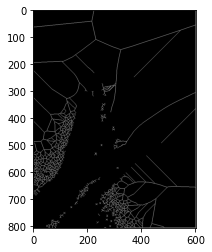

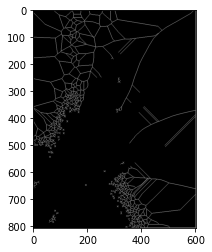

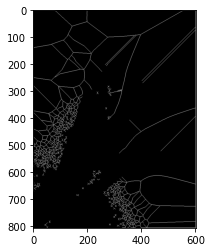

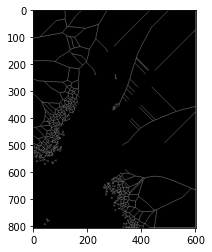

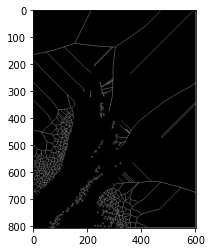

...

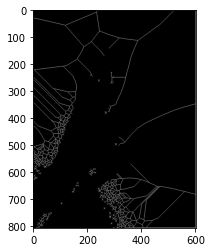

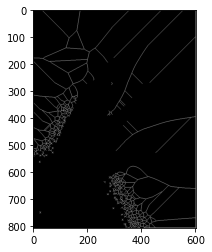

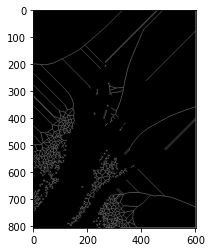

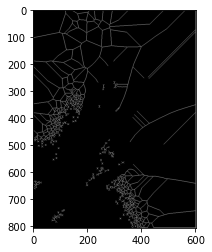

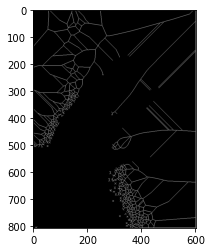

In [68]:
kernel3 = np.ones((6,6),np.float32)/25
# train_images_resized_gray_sk = apply_skeletonize(train_images_resized_gray, kernel3)
# test_images_resized_gray_sk = apply_skeletonize(test_images_resized_gray, kernel3)


# for i in  train_images_resized_gray_sk:
#     ipyplot.plot_images(i, max_images=5, img_width=400)
    
    
# for i in  test_images_resized_gray_sk:
#     ipyplot.plot_images(i, max_images=5, img_width=400)

for i in train_images_resized_gray: 
    for j in i:
        binary = cv2.morphologyEx(j, cv2.MORPH_OPEN, kernel3)
        binary = binary > filters.threshold_otsu(j)
        #print(np.unique(binary))
#         skeleton = morphology.skeletonize(binary)
        skeleton = morphology.medial_axis(binary)
     
        plt.imshow(skeleton, cmap = "gray")
        plt.show()
        aux.append(skeleton)
    train_images_resized_gray_sk.append(aux)
    break 



In [65]:
train_images_resized = pickle.load( open( "D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_train_images_resized", "rb" ) )
test_images_resized = pickle.load( open( "D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_test_images_resized", "rb" ) )
train_images_resized_gray = pickle.load( open( "D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_train_images_resized_gray", "rb" ) )
test_images_resized_gray = pickle.load( open( "D:/FACULTATE/MASTER 1/SEMESTRUL 1/CV1/Laborator/bd/dump_test_images_resized_gray", "rb" ) )

(5, 14)



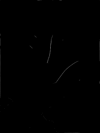
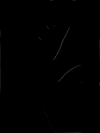
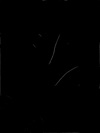
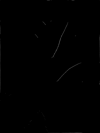
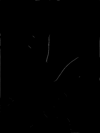
...
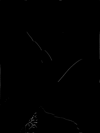
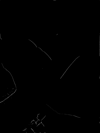
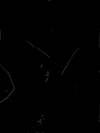
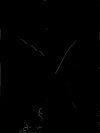
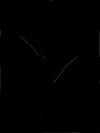

In [66]:
all_sk = []
all_dt_sk = []
for im_set in train_images_resized:
    sk = []
    dt_sk = []
    for im in im_set:
        kernel = np.ones((5,5),np.float32)/25
        dst = cv2.filter2D(im,-1,kernel)
        (b, g, r) = cv2.split(im)
        r = cv2.filter2D(r,-1,kernel)
        ret_r, thresh_r = cv2.threshold(r, 110, 255, cv2.THRESH_BINARY)

        img = thresh_r
        kernel = np.ones((10,10),np.uint8)
        img = cv2.erode(img,kernel,iterations = 1)

        size = np.size(img)
        skel = np.zeros(img.shape,np.uint8)

        element = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
        done = False

        while( not done):
            eroded = cv2.erode(img,element)
            temp = cv2.dilate(eroded,element)
            temp = cv2.subtract(img,temp)
            skel = cv2.bitwise_or(skel,temp)
            img = eroded.copy()

            zeros = size - cv2.countNonZero(img)
            if zeros==size:
                done = True
        x,y = np.nonzero(skel)
        t = np.array(list(zip(x, y))).flatten()
        dt_sk.append(t[0:2000])
        sk.append(skel)
    all_sk.append(sk)
    all_dt_sk.append(dt_sk)


print(np.shape(all_dt_sk))
flat_list = [item for sublist in all_sk for item in sublist]
ipyplot.plot_images(flat_list, max_images=27, img_width=100)